In [17]:
import seaborn as sns
import datetime
from datetime import datetime
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn.tree import export_graphviz
import pydot
import matplotlib.pyplot as plt
import geopandas as gpd

In [18]:
pd.set_option('display.max_columns', 200)

# Importing the dataset

In [19]:
listing = pd.read_csv('sf_airbnb listings.csv')

# Exploring the dataset

In [20]:
listing.head()

,id,listing_url,scrape_id,last_scraped,name,summary,space,description,experiences_offered,neighborhood_overview,notes,transit,access,interaction,house_rules,thumbnail_url,medium_url,picture_url,xl_picture_url,host_id,host_url,host_name,host_since,host_location,host_about,host_response_time,host_response_rate,host_acceptance_rate,host_is_superhost,host_thumbnail_url,host_picture_url,host_neighbourhood,host_listings_count,host_total_listings_count,host_verifications,host_has_profile_pic,host_identity_verified,street,neighbourhood,neighbourhood_cleansed,neighbourhood_group_cleansed,city,state,zipcode,market,smart_location,country_code,country,latitude,longitude,is_location_exact,property_type,room_type,accommodates,bathrooms,bedrooms,beds,bed_type,amenities,square_feet,price,weekly_price,monthly_price,security_deposit,cleaning_fee,guests_included,extra_people,minimum_nights,maximum_nights,minimum_minimum_nights,maximum_minimum_nights,minimum_maximum_nights,maximum_maximum_nights,minimum_nights_avg_ntm,maximum_nights_avg_ntm,calendar_updated,has_availability,availability_30,availability_60,availability_90,availability_365,calendar_last_scraped,number_of_reviews,number_of_reviews_ltm,first_review,last_review,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,requires_license,license,jurisdiction_names,instant_bookable,is_business_travel_ready,cancellation_policy,require_guest_profile_picture,require_guest_phone_verification,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms,reviews_per_month
0,958,https://www.airbnb.com/rooms/958,2.019060e+13,6/2/19,"Bright, Modern Garden Unit - 1BR/1B",New update: the house next door is under const...,"Newly remodeled, modern, and bright garden uni...",New update: the house next door is under const...,none,*Quiet cul de sac in friendly neighborhood *St...,Due to the fact that we have children and a do...,*Public Transportation is 1/2 block away. *Ce...,*Full access to patio and backyard (shared wit...,A family of 4 lives upstairs with their dog. N...,* No Pets - even visiting guests for a short t...,NaN,NaN,https://a0.muscache.com/im/pictures/b7c2a199-4...,NaN,1169,https://www.airbnb.com/users/show/1169,Holly,7/31/08,"San Francisco, California, United States",We are a family with 2 boys born in 2009 and 2...,within a few hours,100%,NaN,t,https://a0.muscache.com/im/pictures/efdad96a-3...,https://a0.muscache.com/im/pictures/efdad96a-3...,Duboce Triangle,1,1,"[''''email'''', ''''phone'''', ''''facebook'''...",t,t,"San Francisco, CA, United States",Lower Haight,Western Addition,NaN,San Francisco,CA,94117,San Francisco,"San Francisco, CA",US,United States,37.76931,-122.43386,t,Apartment,Entire home/apt,3,1.0,1.0,2.0,Real Bed,"{TV,Cable TV,Internet,Wifi,Kitchen,Pets live o...",NaN,$170.00,"$1,120.00","$4,200.00",$100.00,$100.00,2,$25.00,1,30,1,1,30,30,1.0,30.0,2 months ago,t,1,3,7,92,6/2/19,192,56,7/23/09,5/16/19,97.0,10.0,10.0,10.0,10.0,10.0,9.0,t,STR-0001256,{SAN FRANCISCO},t,f,moderate,f,f,1,1,0,0,1.60
1,5858,https://www.airbnb.com/rooms/5858,2.019060e+13,6/2/19,Creative Sanctuary,NaN,We live in a large Victorian house on a quiet ...,We live in a large Victorian house on a quiet ...,none,I love how our neighborhood feels quiet but is...,All the furniture in the house was handmade so...,The train is two blocks away and you can stop ...,"Our deck, garden, gourmet kitchen and extensiv...",NaN,"Please respect the house, the art work, the fu...",NaN,NaN,https://a0.muscache.com/im/pictures/17714/3a7a...,NaN,8904,https://www.airbnb.com/users/show/8904,Philip And Tania,3/2/09,"San Francisco, California, United States",Philip: English transplant to the Bay Area and...,within a day,100%,NaN,f,https://a0.muscache.com/im/users/8904/profile_...,https://a0.muscache.com/im/users/8904/profile_..

In [21]:
listing.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7575 entries, 0 to 7574
Columns: 106 entries, id to reviews_per_month
dtypes: float64(22), int64(22), object(62)
memory usage: 6.1+ MB


In [22]:
listing.describe().round(2)

,id,scrape_id,thumbnail_url,medium_url,xl_picture_url,host_id,host_acceptance_rate,host_listings_count,host_total_listings_count,neighbourhood_group_cleansed,latitude,longitude,accommodates,bathrooms,bedrooms,beds,square_feet,guests_included,minimum_nights,maximum_nights,minimum_minimum_nights,maximum_minimum_nights,minimum_maximum_nights,maximum_maximum_nights,minimum_nights_avg_ntm,maximum_nights_avg_ntm,availability_30,availability_60,availability_90,availability_365,number_of_reviews,number_of_reviews_ltm,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms,reviews_per_month
count,7575.00,7.575000e+03,0.0,0.0,0.0,7.575000e+03,0.0,7575.00,7575.00,0.0,7575.00,7575.00,7575.00,7557.00,7573.00,7568.00,130.00,7575.00,7.575000e+03,7.575000e+03,7.575000e+03,7.575000e+03,7.575000e+03,7.575000e+03,7.575000e+03,7.575000e+03,7575.00,7575.00,7575.00,7575.00,7575.00,7575.00,6038.00,6034.00,6035.00,6033.00,6036.00,6033.00,6033.00,7575.00,7575.00,7575.00,7575.00,6081.00
mean,18096501.21,2.019060e+13,NaN,NaN,NaN,5.200379e+07,NaN,68.81,68.81,NaN,37.77,-122.43,3.21,1.35,1.35,1.78,1057.02,1.74,1.321773e+04,1.374270e+04,1.321756e+04,1.324513e+04,1.371885e+04,1.374566e+04,1.322917e+04,1.373017e+04,6.47,16.37,29.20,146.52,44.27,14.38,95.64,9.78,9.63,9.86,9.84,9.68,9.42,20.72,17.18,3.00,0.53,1.88
std,11174221.41,0.000000e+00,NaN,NaN,NaN,6.879887e+07,NaN,235.17,235.17,NaN,0.02,0.03,1.93,0.81,0.94,1.18,832.04,1.36,1.148970e+06,1.148964e+06,1.148970e+06,1.148970e+06,1.148965e+06,1.148964e+06,1.148970e+06,1.148965e+06,8.98,19.22,29.18,125.31,74.79,22.52,6.99,0.68,0.77,0.53,0.59,0.70,0.80,51.74,50.25,7.19,2.98,2.04
min,958.00,2.019060e+13,NaN,NaN,NaN,4.600000e+01,NaN,0.00,0.00,NaN,37.70,-122.51,1.00,0.00,0.00,0.00,0.00,1.00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,0.00,0.00,0.00,0.00,0.00,0.00,20.00,2.00,2.00,2.00,2.00,2.00,2.00,1.00,0.00,0.00,0.00,0.01
25%,7749788.00,2.019060e+13,NaN,NaN,NaN,4.060742e+06,NaN,1.00,1.00,NaN,37.75,-122.44,2.00,1.00,1.00,1.00,500.00,1.00,2.000000e+00,2.900000e+01,2.000000e+00,2.000000e+00,2.800000e+01,2.900000e+01,2.000000e+00,2.900000e+01,0.00,0.00,2.00,24.00,1.00,0.00,95.00,10.00,9.00,10.00,10.00,10.00,9.00,1.00,0.00,0.00,0.00,0.32
50%,19413966.00,2.019060e+13,NaN,NaN,NaN,1.875693e+07,NaN,2.00,2.00,NaN,37.77,-122.42,2.00,1.00,1.00,1.00,871.50,1.00,4.000000e+00,1.800000e+02,4.000000e+00,4.000000e+00,1.800000e+02,1.800000e+02,4.000000e+00,1.800000e+02,2.00,8.00,20.00,119.00,11.00,3.00,98.00,10.00,10.00,10.00,10.00,10.00,10.00,2.00,1.00,0.00,0.00,1.07
75%,28241800.50,2.019060e+13,NaN,NaN,NaN,7.437275e+07,NaN,10.00,10.00,NaN,37.79,-122.41,4.00,1.50,2.00,2.00,1500.00,2.00,3.000000e+01,1.125000e+03,3.000000e+01,3.000000e+01,1.125000e+03,1.125000e+03,3.000000e+01,1.125000e+03,10.00,29.00,52.00,275.00,55.00,20.00,100.00,10.00,10.00,10.00,10.00,10.00,10.00,7.00,2.00,2.00,0.00,2.83
max,35291911.00,2.019060e+13,NaN,NaN,NaN,2.649238e+08,NaN,1235.00,1235.00,NaN,37.81,-122.37,16.00,14.00,14.00,14.00,5500.00,16.00,1.000000e+08,1.000000e+08,1.000000e+08,1.000000e+08,1.000000e+08,1.000000e+08,1.000000e+08,1.000000e+08,30.00,60.00,90.00,365.00,712.00,159.00,100.00,10.00,10.00,10.00,10.00,10.00,10.00,241.00,241.00,46.00,25.00,20.00


# Cleaning the data

For the purpose of this project, we will not be using NLP techniques, in this case, we will be dropping all the free text columns

In [23]:
columns_to_drop= ['listing_url', 'scrape_id', 'last_scraped', 'name', 'summary',
                  'space', 'description', 'neighborhood_overview', 'notes',
                  'transit', 'access', 'interaction', 'house_rules', 'thumbnail_url',
                  'medium_url', 'picture_url', 'xl_picture_url', 'host_id', 'host_url',
                  'host_name', 'host_location', 'host_about', 'host_thumbnail_url',
                  'host_picture_url', 'host_verifications',
                  'calendar_last_scraped']
listing_dropped = listing.drop(columns_to_drop, axis = 1)

We will drop now entries having missing values as a majority

In [24]:
print(
      round((listing_dropped
      .isnull()
      .sum().sort_values())/len(listing_dropped.index),2)
      )

id                                             0.00
calculated_host_listings_count                 0.00
price                                          0.00
require_guest_phone_verification               0.00
require_guest_profile_picture                  0.00
cancellation_policy                            0.00
calculated_host_listings_count_shared_rooms    0.00
guests_included                                0.00
extra_people                                   0.00
minimum_nights                                 0.00
maximum_nights                                 0.00
minimum_minimum_nights                         0.00
maximum_minimum_nights                         0.00
amenities                                      0.00
minimum_maximum_nights                         0.00
minimum_nights_avg_ntm                         0.00
maximum_nights_avg_ntm                         0.00
calendar_updated                               0.00
has_availability                               0.00
availability

As we can see, We will drop the feaatures that have over 85% of missing values

In [25]:
listing_dropped.drop(['host_acceptance_rate', 'neighbourhood_group_cleansed', 
                      'square_feet', 'weekly_price', 'monthly_price'], axis=1, inplace=True)

The information related to the location is not relevant since we know that we're working on a dataset that is about the area of San Francisco however, We will keep neighbourhood_cleansed in order to have the districts of the listing which could
be helpful to our predictions, we'll store longitude and lattitude for later use

In [26]:
long_lat = listing_dropped[['latitude', 'longitude']]

listing_dropped.drop(['street', 'neighbourhood', 'city', 'state', 'zipcode', 
                      'market', 'smart_location', 'country_code', 'country', 
                      'is_location_exact', 'longitude', 'latitude','license',
                      'jurisdiction_names'], axis=1, inplace= True) 

Let's remove the columns that are similar to host_total_listing_count since these columns are highly correlated with it

In [27]:
listing_dropped.drop(['host_total_listings_count','calculated_host_listings_count', 
                       'calculated_host_listings_count_entire_homes', 
                       'calculated_host_listings_count_private_rooms', 
                       'calculated_host_listings_count_shared_rooms'], axis=1, inplace=True)

I noticed some similarities on the data for minimum and maximum night stay, I will only be keeping minmum_nights and maximum_nights

In [28]:
listing_dropped.drop(['minimum_minimum_nights','minimum_maximum_nights', 
                       'maximum_minimum_nights','maximum_maximum_nights', 
                       'minimum_nights_avg_ntm', 'maximum_nights_avg_ntm'], axis=1, inplace=True)

Let's take a look at the shape of our data

In [29]:
listing_dropped.shape

(7575, 50)

Awesome! We dropped more than half of the features that we did not need

In [30]:
listing_dropped.head()

,id,experiences_offered,host_since,host_response_time,host_response_rate,host_is_superhost,host_neighbourhood,host_listings_count,host_has_profile_pic,host_identity_verified,neighbourhood_cleansed,property_type,room_type,accommodates,bathrooms,bedrooms,beds,bed_type,amenities,price,security_deposit,cleaning_fee,guests_included,extra_people,minimum_nights,maximum_nights,calendar_updated,has_availability,availability_30,availability_60,availability_90,availability_365,number_of_reviews,number_of_reviews_ltm,first_review,last_review,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,requires_license,instant_bookable,is_business_travel_ready,cancellation_policy,require_guest_profile_picture,require_guest_phone_verification,reviews_per_month
0,958,none,7/31/08,within a few hours,100%,t,Duboce Triangle,1,t,t,Western Addition,Apartment,Entire home/apt,3,1.0,1.0,2.0,Real Bed,"{TV,Cable TV,Internet,Wifi,Kitchen,Pets live o...",$170.00,$100.00,$100.00,2,$25.00,1,30,2 months ago,t,1,3,7,92,192,56,7/23/09,5/16/19,97.0,10.0,10.0,10.0,10.0,10.0,9.0,t,t,f,moderate,f,f,1.60
1,5858,none,3/2/09,within a day,100%,f,Bernal Heights,2,t,t,Bernal Heights,Apartment,Entire home/apt,5,1.0,2.0,3.0,Real Bed,"{Internet,Wifi,Kitchen,Heating,Family/kid frie...",$235.00,NaN,$100.00,2,$0.00,30,60,3 days ago,t,0,0,0,0,111,0,5/3/09,8/6/17,98.0,10.0,10.0,10.0,10.0,10.0,9.0,t,f,f,strict_14_with_grace_period,f,f,0.90
2,7918,none,6/17/09,within a few hours,100%,f,Cole Valley,10,t,t,Haight Ashbury,Apartment,Private room,2,4.0,1.0,1.0,Real Bed,"{TV,Internet,Wifi,Kitchen,Free street parking,...",$65.00,$200.00,$50.00,1,$12.00,32,60,19 months ago,t,30,60,90,365,17,0,8/31/09,11/21/16,85.0,8.0,8.0,9.0,9.0,9.0,8.0,t,f,f,strict_14_with_grace_period,f,f,0.14
3,8142,none,6/17/09,within a few hours,100%,f,Cole Valley,10,t,t,Haight Ashbury,Apartment,Private room,2,4.0,1.0,1.0,Real Bed,"{TV,Internet,Wifi,Kitchen,Free street parking,...",$65.00,$200.00,$50.00,1,$12.00,32,90,19 months ago,t,11,41,71,346,8,1,9/8/14,9/12/18,93.0,9.0,9.0,10.0,10.0,9.0,9.0,t,f,f,strict_14_with_grace_period,f,f,0.14
4,8339,none,7/2/09,within an hour,100%,f,Alamo Square,2,t,t,Western Addition,House,Entire home/apt,5,1.5,2.0,2.0,Real Bed,"{TV,Internet,Wifi,Kitchen,Heating,Family/kid f...",$685.00,$0.00,$225.00,2,$150.00,4,1125,2 weeks ago,t,30,60,90,90,27,1,9/25/09,8/11/18,97.0,10.0,10.0,10.0,10.0,10.0,9.0,t,f,f,moderate,t,t,0.23


# Categorical features

We notice that there are plenty of categorical features and boolean features. Let's turn them into numbers shall we?!!!
<br>
Let's start by turning all of the categorical features labeled 't' to 1 and 'f' to 0

In [31]:
listing_dropped.replace({'f': 0, 't': 1}, inplace= True)

Let's plot some histograms for the distribution of our values:

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x0000015E3A69F860>,
      dtype=object)

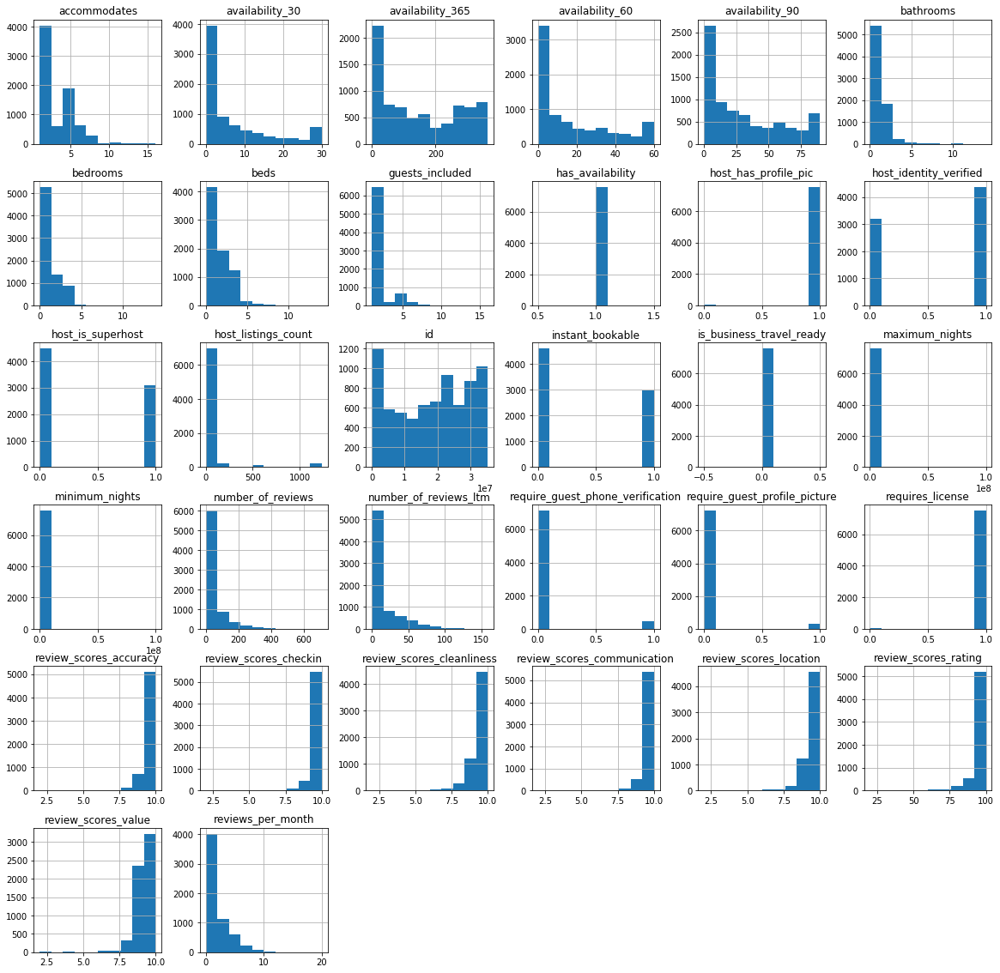

In [32]:
listing_dropped.hist(figsize=(20,20))

Many features have only one category (i.e one value only either 0 or 1, this is not helpful to our model) so we will be dropping them

In [33]:
listing_dropped.drop(['has_availability', 'host_has_profile_pic', 
                      'is_business_travel_ready', ], axis=1, inplace= True)

Let us now take a look at each of our columns and clean them individually

### Experiences_offered 

In [34]:
listing_dropped.experiences_offered.value_counts()

none    7575
Name: experiences_offered, dtype: int64

This feature has only 'none' as a value so we will be dropping it

In [35]:
listing_dropped.drop(['experiences_offered'], axis= 1, inplace= True)

### host_since

we will convert the host_since column into days_active, we'll consider the day of the scrape as the current date and count from there

In [36]:
listing_dropped.host_since = pd.to_datetime(listing_dropped.host_since)
listing_dropped['days_active'] = (datetime(2019, 6, 2) - listing_dropped['host_since']).astype('timedelta64[D]')

### host_response_time

In [37]:
listing_dropped.host_response_time.value_counts()

within an hour        4303
within a few hours    1807
within a day           616
a few days or more      77
Name: host_response_time, dtype: int64

In [38]:
listing_dropped.host_response_time.isnull().sum()

772

We will fill the missing values for this one with "unknown"

In [39]:
listing_dropped.host_response_time.fillna("unknown", inplace= True)

### host_response_rate

Let's remove the percentage sign for this one

In [40]:
listing_dropped.host_response_rate = listing_dropped.host_response_rate.str[:-1].astype('float64') 
print("mean response rate is:", round(listing_dropped.host_response_rate.mean(), 2))
print("mdian response rate is:", round(listing_dropped.host_response_rate.median(), 2))
print("the proportion of those who respond 100% of the time is:", round((listing_dropped.host_response_rate == 100).sum()/listing_dropped.host_response_rate.count(),2))

mean response rate is: 95.99
mdian response rate is: 100.0
the proportion of those who respond 100% of the time is: 0.72


Since most entries have a response rate of 100% we will turn these numerical values into categories Creating four categories

In [41]:
#Creating four categories
listing_dropped.host_response_rate = pd.cut(listing_dropped.host_response_rate, 
                                            bins=[0, 50, 90, 99, 100], 
                                            labels=['0-49%', '50-89%', '90-99%', '100%' ],
                                            include_lowest=True)

In [42]:
#Converting back to string
listing_dropped.host_response_rate = listing_dropped.host_response_rate.astype('str')

In [43]:
#Replace nulls with unknown
listing_dropped.host_response_rate.replace('nan', 'unknown', inplace=True)

### host_is_superhost

In [44]:
listing_dropped.host_is_superhost.value_counts()

0    4471
1    3104
Name: host_is_superhost, dtype: int64

This one has a good distribution and no null values so it will remain unchanged

### Property_type

In [45]:
listing_dropped.property_type.value_counts()

Apartment             3045
House                 2153
Condominium            796
Guest suite            529
Boutique hotel         232
Hotel                  155
Townhouse              146
Serviced apartment     128
Hostel                  92
Loft                    87
Guesthouse              47
Bed and breakfast       37
Other                   29
Aparthotel              28
Resort                  18
Bungalow                18
Villa                   12
Cottage                  9
Tiny house               2
Boat                     2
Cabin                    2
Earth house              2
Timeshare                1
Hut                      1
In-law                   1
Tent                     1
Camper/RV                1
Treehouse                1
Name: property_type, dtype: int64

the most dominant property type is 'House' and 'Apartment', we will replace every other type of house with one of those

In [46]:
#We will replace some property names, we will keep the most dominant ones however
listing_dropped.property_type.replace({'Townhouse': 'House',
                                       'Serviced apartment': 'Apartment',
                                       'Loft': 'Apartment',
                                       'Guesthouse': 'House',
                                       'Bungalow': 'House',
                                       'Villa': 'House',
                                       'Cottage': 'House',
                                       'Tiny house': 'House',
                                       'Cabin': 'House',
                                       'Earth house': 'House',
                                      'Condominium': 'Apartment',
                                      'Guest suite': 'Apartment'},
                                       inplace=True)

In [47]:
listing_dropped.loc[~listing_dropped.property_type.isin(['House', 'Apartment']),'property_type'] = 'Other'

In [48]:
listing_dropped.property_type.value_counts()

Apartment    4585
House        2391
Other         599
Name: property_type, dtype: int64

### Room_type

In [49]:
listing_dropped.room_type.value_counts()

Entire home/apt    4595
Private room       2753
Shared room         227
Name: room_type, dtype: int64

There are three room types, we will be keeping this feature unchanged


### bedrooms, bathrooms and beds

In [50]:
print(listing_dropped.bathrooms.isnull().sum())
print(listing_dropped.bedrooms.isnull().sum())
print(listing_dropped.beds.isnull().sum())

18
2
7


There is a very small fraction of missing values, let's go ahead and replace these missing values with the median

In [51]:
for col in ['bathrooms', 'bedrooms', 'beds']:
    listing_dropped[col].fillna(listing_dropped[col].median(), inplace=True)

### accommodates

In [52]:
listing_dropped.accommodates.value_counts()

2     3362
4     1568
1      683
6      624
3      609
5      325
8      193
7       97
10      52
12      23
9       17
15       7
11       7
14       4
16       3
13       1
Name: accommodates, dtype: int64

This feature will remain unchanged but will be explored later 

### bed_types

In [53]:
listing_dropped.bed_type.value_counts()


Real Bed         7505
Futon              30
Pull-out Sofa      23
Airbed             11
Couch               6
Name: bed_type, dtype: int64

As we can see, Real Bed represents over 99% of the feature values, which means using it for our model will not be helpful. So we will drop it

In [54]:
listing_dropped.drop(['bed_type'], axis= 1, inplace=True)

### amenities

This one is a complicated piece of the puzzle, he importance for amenities affects the price, however we have a lot of amenities, we want to emphasize on the important ones, so we will take the amenities mentioned and split them into a set of amenities for each house, and then we will encode them based on their availability for each house 

In [55]:
amenities_list = list(listing_dropped.amenities)
amenities_list_string = "".join(amenities_list)
amenities_list_string = amenities_list_string.replace('{', '')
amenities_list_string = amenities_list_string.replace('}', '')
amenities_list_string = amenities_list_string.replace('"', '')
amenities_set = [x.strip() for x in amenities_list_string.split(',')]
amenities_set = set(amenities_set)

With the help of some extra research, the amenities that are most important will be taken into consideration and the rest will be dropped due to being less important or very uncommon. We will create a column for each important feature and it will be 1 or 0 for available and not available  

In [56]:
listing_dropped.loc[listing_dropped['amenities'].str.contains('24-hour check-in'), 'check_in_24h'] = 1
listing_dropped.loc[listing_dropped['amenities'].str.contains('Air conditioning|Central air conditioning'), 'air_conditioning'] = 1
listing_dropped.loc[listing_dropped['amenities'].str.contains('Amazon Echo|Apple TV|Game console|Netflix|Projector and screen|Smart TV'), 'high_end_electronics'] = 1
listing_dropped.loc[listing_dropped['amenities'].str.contains('BBQ grill|Fire pit|Propane barbeque'), 'bbq'] = 1
listing_dropped.loc[listing_dropped['amenities'].str.contains('Balcony|Patio'), 'balcony'] = 1
listing_dropped.loc[listing_dropped['amenities'].str.contains('Beach view|Beachfront|Lake access|Mountain view|Ski-in/Ski-out|Waterfront'), 'nature_and_views'] = 1
listing_dropped.loc[listing_dropped['amenities'].str.contains('Bed linens'), 'bed_linen'] = 1
listing_dropped.loc[listing_dropped['amenities'].str.contains('Breakfast'), 'breakfast'] = 1
listing_dropped.loc[listing_dropped['amenities'].str.contains('TV'), 'tv'] = 1
listing_dropped.loc[listing_dropped['amenities'].str.contains('Coffee maker|Espresso machine'), 'coffee_machine'] = 1
listing_dropped.loc[listing_dropped['amenities'].str.contains('Cooking basics'), 'cooking_basics'] = 1
listing_dropped.loc[listing_dropped['amenities'].str.contains('Dishwasher|Dryer|Washer'), 'white_goods'] = 1
listing_dropped.loc[listing_dropped['amenities'].str.contains('Elevator'), 'elevator'] = 1
listing_dropped.loc[listing_dropped['amenities'].str.contains('Exercise equipment|Gym|gym'), 'gym'] = 1
listing_dropped.loc[listing_dropped['amenities'].str.contains('Family/kid friendly|Children|children'), 'child_friendly'] = 1
listing_dropped.loc[listing_dropped['amenities'].str.contains('parking'), 'parking'] = 1
listing_dropped.loc[listing_dropped['amenities'].str.contains('Garden|Outdoor|Sun loungers|Terrace'), 'outdoor_space'] = 1
listing_dropped.loc[listing_dropped['amenities'].str.contains('Host greets you'), 'host_greeting'] = 1
listing_dropped.loc[listing_dropped['amenities'].str.contains('Hot tub|Jetted tub|hot tub|Sauna|Pool|pool'), 'hot_tub_sauna_or_pool'] = 1
listing_dropped.loc[listing_dropped['amenities'].str.contains('Internet|Pocket wifi|Wifi'), 'internet'] = 1
listing_dropped.loc[listing_dropped['amenities'].str.contains('Long term stays allowed'), 'long_term_stays'] = 1
listing_dropped.loc[listing_dropped['amenities'].str.contains('Pets|pet|Cat(s)|Dog(s)'), 'pets_allowed'] = 1
listing_dropped.loc[listing_dropped['amenities'].str.contains('Private entrance'), 'private_entrance'] = 1
listing_dropped.loc[listing_dropped['amenities'].str.contains('Safe|Security system'), 'secure'] = 1
listing_dropped.loc[listing_dropped['amenities'].str.contains('Self check-in'), 'self_check_in'] = 1
listing_dropped.loc[listing_dropped['amenities'].str.contains('Smoking allowed'), 'smoking_allowed'] = 1
listing_dropped.loc[listing_dropped['amenities'].str.contains('Step-free access|Wheelchair|Accessible'), 'accessible'] = 1
listing_dropped.loc[listing_dropped['amenities'].str.contains('Suitable for events'), 'event_suitable'] = 1

C:\Users\abder\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:22: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.


In [57]:
#Let's replace the null values with 0
for col in ['check_in_24h', 'air_conditioning', 'high_end_electronics', 'bbq', 'balcony', 'nature_and_views', 
            'bed_linen', 'breakfast', 'tv', 'coffee_machine', 'cooking_basics', 'white_goods', 'elevator','gym',
            'child_friendly', 'parking', 'outdoor_space', 'host_greeting', 'host_greeting', 'hot_tub_sauna_or_pool', 'internet', 'long_term_stays',
            'pets_allowed', 'private_entrance', 'secure', 'self_check_in', 'smoking_allowed', 'accessible', 'event_suitable']:
    listing_dropped[col].fillna(0, inplace=True)

Now we will drop the features that are mentioned on less than 10% of the listing

In [58]:
infrequent_amenities = []
for col in listing_dropped.iloc[:,46:].columns:
    if listing_dropped[col].sum() < len(listing_dropped)/10:
        infrequent_amenities.append(col)
print(infrequent_amenities)
listing_dropped.drop(infrequent_amenities, axis = 1, inplace = True)

['high_end_electronics', 'nature_and_views', 'hot_tub_sauna_or_pool', 'smoking_allowed', 'accessible', 'event_suitable']


# Taking care of the numerical features

### Price

Let's check if this column has missing values and convert the price to int

In [59]:
listing_dropped.price.isnull().sum()

0

In [60]:
listing_dropped.price = listing_dropped.price.str[1:-3]
listing_dropped.price = listing_dropped.price.str.replace(",","")
listing_dropped.price = listing_dropped.price.str.replace(".","")
listing_dropped.price = listing_dropped.price.astype('int64')

### security_deposit

In [61]:
#Let's check if this column has missing values and convert the values to int
listing_dropped.security_deposit.isnull().sum()

1543

For the missing security deposits, this is probably because those hosts did not have security deposit associated with their listings meaning that it is equal to 0, we will replace those missing values with 0

In [62]:
listing_dropped.security_deposit = listing_dropped.security_deposit.str[1:-3]
listing_dropped.security_deposit = listing_dropped.security_deposit.str.replace(",","")
listing_dropped.security_deposit = listing_dropped.security_deposit.str.replace(".","")
listing_dropped.security_deposit.fillna(0, inplace=True)
listing_dropped.security_deposit = listing_dropped.security_deposit.astype('int64')

We will do the same for cleaning_fee and extra_people values

In [63]:
#Let's check if this column has missing values and convert the values to int
listing_dropped.cleaning_fee = listing_dropped.cleaning_fee.str[1:-3]
listing_dropped.cleaning_fee = listing_dropped.cleaning_fee.str.replace(",","")
listing_dropped.cleaning_fee = listing_dropped.cleaning_fee.str.replace(".","")
listing_dropped.cleaning_fee.fillna(0, inplace=True)
listing_dropped.cleaning_fee = listing_dropped.cleaning_fee.astype('int64')

In [64]:
listing_dropped.extra_people = listing_dropped.extra_people.str[1:-3]
listing_dropped.extra_people = listing_dropped.extra_people.str.replace(",","")
listing_dropped.extra_people = listing_dropped.extra_people.str.replace(".","")
listing_dropped.extra_people.fillna(0, inplace=True)
listing_dropped.extra_people = listing_dropped.extra_people.astype('int64')

### Calendar_updated

This feature has a lot of attributes, keeping them can harm our model so for now, we will drop them

In [65]:
listing_dropped.calendar_updated.value_counts()
listing_dropped.drop(['calendar_updated'], axis= 1, inplace=True)

### Availability

There are multiple availability columns for 30, 60, 90 and 365 days. This is basically the same feature that is repeated we will consider an availability of 90 days since SF is very expensive and the earlier people book the lower is gonna be the price in general

In [66]:
listing_dropped.drop(['availability_30', 'availability_60', 'availability_365'], 
                     axis= 1, inplace=True)

### Number of reviews and number_of_reviews_ltm

The reviews are very important to making the decision of booking. For our case, these reviews havea lot of missing values, but they are useful since we can infer from them that those listing have either not been booked yet or maybe these are new lisitngs

In [67]:
#converting to datetime
listing_dropped.first_review = pd.to_datetime(listing_dropped.first_review)
#calculating the number of days of activity for the hosts
listing_dropped['days_since_first_review'] = (datetime(2019, 6, 2) - listing_dropped['first_review']).astype('timedelta64[D]')

Let's take a look at histograms representing the days since the first review

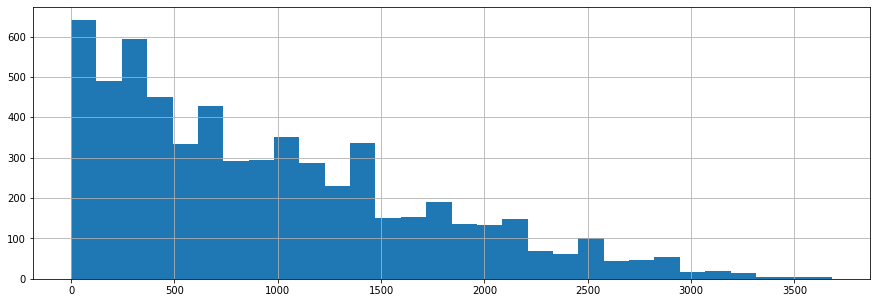

In [68]:
listing_dropped.days_since_first_review.hist(figsize=(15,5), bins=30)

Let's create a binning function that takes in a column name, bin cut points and labels, replaces the original column with a binned version, and replaces nulls (with 'unknown' if unspecified).

In [69]:
def bin_column(col, bins, labels, na_label='unknown'):
    listing_dropped[col] = pd.cut(listing_dropped[col], bins=bins, labels=labels, include_lowest=True)
    listing_dropped[col] = listing_dropped[col].astype('str')
    listing_dropped[col].fillna(na_label, inplace=True)

Let's bin the first_time_reviews

In [70]:
bin_column('days_since_first_review',
           bins=[0, 182, 365, 730, 1460, max(listing_dropped.days_since_first_review)],
           labels=['0-6 months',
                   '6-12 months',
                   '1-2 years',
                   '2-4 years',
                   '4+ years'],
           na_label='no reviews')  
listing_dropped.days_since_first_review.replace('nan', 'no reviews', inplace=True)

### last_review

We follow the same procedure as first review

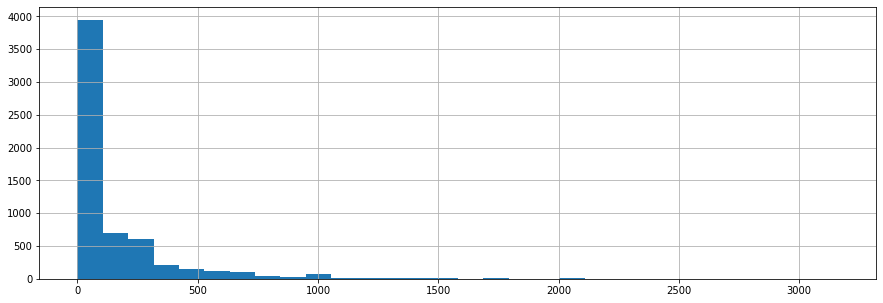

In [71]:
listing_dropped.last_review = pd.to_datetime(listing_dropped.last_review)
listing_dropped['days_since_last_review'] = (datetime(2019, 6, 2) - listing_dropped['last_review']).astype('timedelta64[D]')
listing_dropped.days_since_last_review.hist(figsize=(15,5), bins=30)

In [72]:
bin_column('days_since_last_review',
           bins=[0, 14, 60, 182, 365, max(listing_dropped.days_since_last_review)],
           labels=['0-2 weeks',
                   '2-8 weeks',
                   '2-6 months',
                   '6-12 months',
                   '1+ years'],
           na_label='no reviews')  
listing_dropped.days_since_last_review.replace('nan', 'no reviews', inplace=True)

listing_dropped.drop(['last_review'], axis=1, inplace=True)

### Review_columns

Let's try and visualize a histogram for these reviews

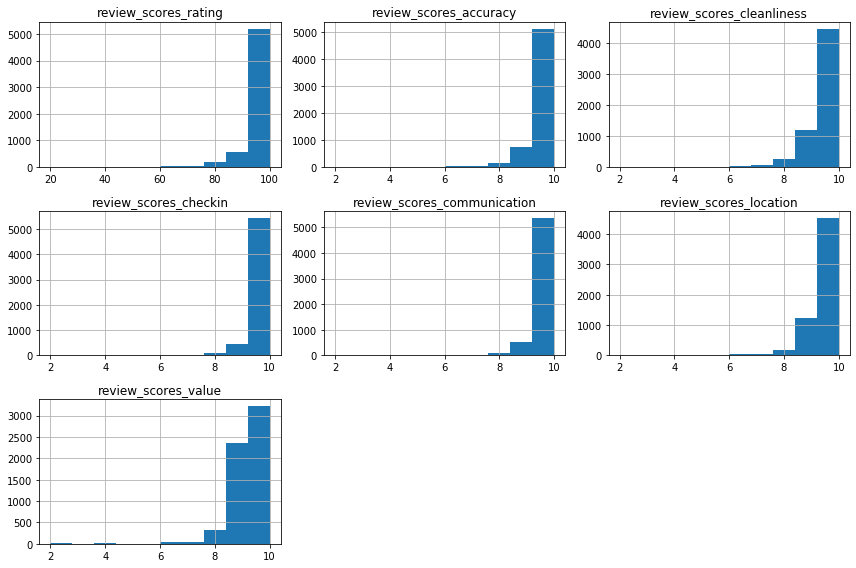

In [73]:
review_columns= list(listing_dropped.columns[listing_dropped.columns.str.startswith("review_scores")==True])
fig= plt.figure(figsize=(12,8))
for i,var in enumerate(review_columns):
    ax= fig.add_subplot(3,3,i+1)
    listing_dropped[var].hist(bins=10, ax=ax)
    ax.set_title(var)
fig.tight_layout()
plt.show()

Binning the ratings that are on a scale from 1 to 10:

In [74]:
review_columns.remove('review_scores_rating')

for i in review_columns:
    bin_column(i,
           bins=[0, 8, 9, 10],
           labels=['0-8/10',
                   '9/10',
                   '10/10'],
           na_label='no rating')  
for col in review_columns:
    listing_dropped[col].replace('nan', 'no rating', inplace=True)


bin_column('review_scores_rating',
           bins=[0, 80, 95, 100],
           labels=['0-79/100',
                   '80-94/100',
                   '95-100/100'],
           na_label='no rating') 
listing_dropped.review_scores_rating.replace('nan', 'no rating', inplace=True)

### Cancellation policy 

In [75]:
listing_dropped.cancellation_policy.value_counts()

strict_14_with_grace_period    3340
moderate                       2585
flexible                       1494
strict                           83
super_strict_30                  50
super_strict_60                  23
Name: cancellation_policy, dtype: int64

We will include all the strict under the same category

In [76]:
listing_dropped.replace({'strict': 'strict_14_with_grace_period',
                        'super_strict_30': 'strict_14_with_grace_period',
                        'super_strict_60': 'strict_14_with_grace_period'},inplace=True)

We will drop number_of_reviews_ltm and reviews_per_month

In [77]:
listing_dropped.drop(['number_of_reviews_ltm', 'reviews_per_month'], axis=1, inplace=True)

In [78]:
listing_dropped.drop(['requires_license'], axis=1, inplace=True)

# Exploratory Data Analysis

How long have people been listing their homes on Airbnb in SF?

In [79]:
print('the first airbnb joined on', min(listing_dropped.host_since), 
      'while the most recent one joined on', max(listing_dropped.host_since))

the first airbnb joined on 2008-03-03 00:00:00 while the most recent one joined on 2019-05-29 00:00:00


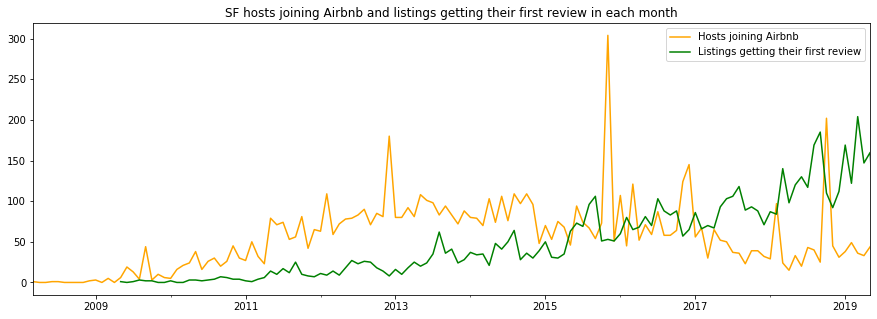

In [80]:
plt.figure(figsize=(15,5))
listing_dropped.set_index('host_since').resample('MS').size().plot(label='Hosts joining Airbnb', color='orange')
listing_dropped.set_index('first_review').resample('MS').size().plot(label='Listings getting their first review', color='green')
plt.title('SF hosts joining Airbnb and listings getting their first review in each month')
plt.legend()
plt.xlim('2008-03-01', '2019-05-31') # Limiting to whole months
plt.xlabel('')
plt.ylabel('')
plt.show()

The first listing was added on March 2008 and it has been increasing since then
<br>
SF passed some laws in 2014 related to Airbnb, perhaps the peak on 2016 was a result of these laws when people started re-enlisting their properties based on these laws
<br>
There’s some seasonality, maybe people who leave in the summer enlist their homes for that period


How did the price change throughout the years?

C:\Users\abder\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:2: RuntimeWarning: divide by zero encountered in log
  


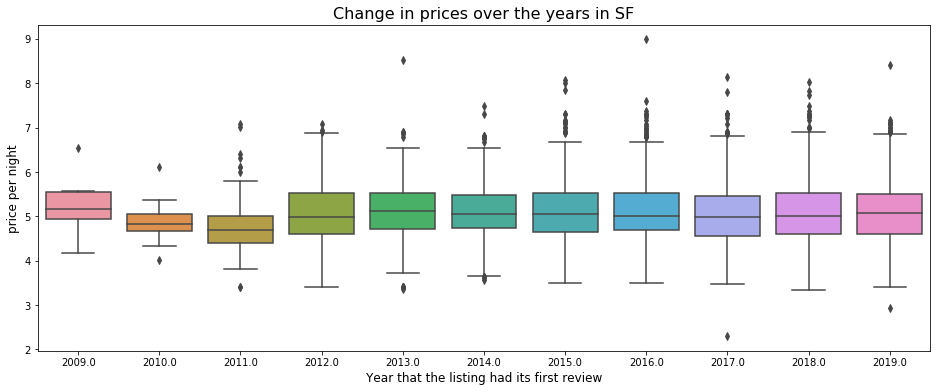

Average price per night in SF over the years:
first_review
2009-01-01    236.22
2010-01-01    137.53
2011-01-01    155.85
2012-01-01    210.49
2013-01-01    226.64
2014-01-01    208.16
2015-01-01    223.28
2016-01-01    224.53
2017-01-01    199.02
2018-01-01    210.37
2019-01-01    214.30
Name: price, dtype: float64


In [81]:
plt.figure(figsize=(16,6))
sns.boxplot(listing_dropped.first_review.dt.year, np.log(listing_dropped.price))
plt.xlabel('Year that the listing had its first review', fontsize=12)
plt.ylabel('price per night', fontsize=12)
plt.title('Change in prices over the years in SF', fontsize=16)
plt.show()

print('Average price per night in SF over the years:')
print(round(listing_dropped.set_index('first_review').price.resample('YS').mean(),2))

The price did not change over the years, it hovered around $200 but one thing is sure...SF is damn expensive!


In [82]:
# Dropping host_since and first_review as they are no longer needed
listing_dropped.drop(['host_since', 'first_review'], axis=1, inplace=True)

Let's check the numerical categories

Looking at the price distribution:

In [83]:
print('the lowest price is', round(min(listing_dropped.price),2), 
      'while the highest price is', round(max(listing_dropped.price),2))

the lowest price is 0 while the highest price is 8000


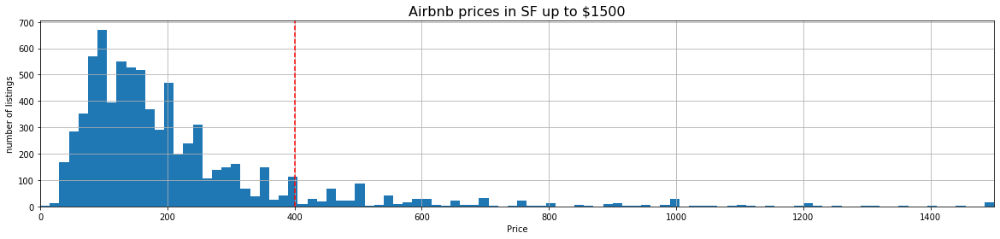

In [84]:
plt.figure(figsize=(20,4))
listing_dropped.price.hist(bins=100, range=(0,1500))
plt.margins(x=0)
plt.axvline(400, color='red', linestyle='--')
plt.xlabel('Price')
plt.ylabel('number of listings')
plt.title('Airbnb prices in SF up to $1500', fontsize=16)
plt.show()

We will replace the price that are under 20 with 20 and those over 1500 with 1500

In [85]:
listing_dropped.loc[listing_dropped.price<=20, 'price']=20
listing_dropped.loc[listing_dropped.price>=1500, 'price']=1500

Let's look at the host listing count

In [86]:
print("Median number of listings per host:", int(listing_dropped.host_listings_count.median()))
print("Mean number of listings per host:", int(round(listing_dropped.host_listings_count.mean())))
print(f"{int(round(100*len(listing_dropped[listing_dropped.host_listings_count == 1])/len(listing_dropped)))}% of listings are from hosts with one listing.")

Median number of listings per host: 2
Mean number of listings per host: 69
35% of listings are from hosts with one listing.


Let's check the number of people accommodated, bathrooms, bedrooms and beds

Let's check the accommodation first

(0.5, 15.5)

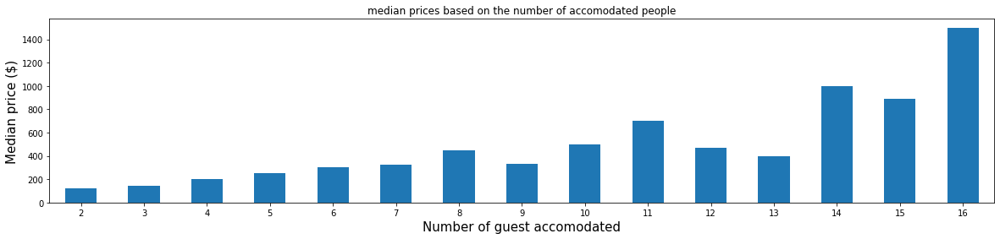

In [87]:
plt.figure(figsize=(20,4))
listing_dropped.groupby('accommodates').price.median().plot(kind='bar')
plt.xlabel('Number of guest accomodated', fontsize=15)
plt.ylabel('Median price ($)', fontsize=15)
plt.title('median prices based on the number of accomodated people')
plt.xticks(rotation=0)
plt.xlim(left=0.5)

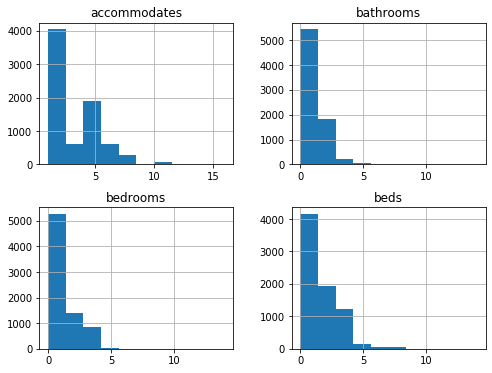

In [88]:
listing_dropped[['accommodates', 'bathrooms', 'bedrooms', 'beds']].hist(figsize=(8,6));


Let's go ahead and visualize the listings based on the geographic location

In [89]:
listing_dropped.rename(columns={'neighbourhood_cleansed': 'areas'}, inplace=True)

We will Import the SF districts boundary GeoJSON file as a dataframe in geopandas


In [90]:
map_df = gpd.read_file('SF Find Neighborhoods.geojson')
map_df.head()

,link,name,geometry
0,"http://en.wikipedia.org/wiki/Sea_Cliff,_San_Fr...",Seacliff,"MULTIPOLYGON (((-122.49346 37.78352, -122.4937..."
1,None,Lake Street,"MULTIPOLYGON (((-122.48715 37.78379, -122.4872..."
2,http://www.nps.gov/prsf/index.htm,Presidio National Park,"MULTIPOLYGON (((-122.47758 37.81099, -122.4771..."
3,None,Presidio Terrace,"MULTIPOLYGON (((-122.47241 37.78735, -122.4710..."
4,http://www.sfgate.com/neighborhoods/sf/innerri...,Inner Richmond,"MULTIPOLYGON (((-122.47263 37.78631, -122.4668..."


In [91]:
# Creating a dataframe of listing counts and median price by borough
area_df = pd.DataFrame(listing_dropped.groupby('areas').size())
area_df.rename(columns={0: 'number_of_listings'}, inplace=True)
area_df['median_price'] = listing_dropped.groupby('areas').price.median().values

In [92]:
# Joining the dataframes
area_map_df = map_df.set_index('name').join(area_df)

What areas have the most listings and what areas are the most expensive?

C:\Users\abder\AppData\Local\Continuum\anaconda3\lib\site-packages\matplotlib\colors.py:479: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1


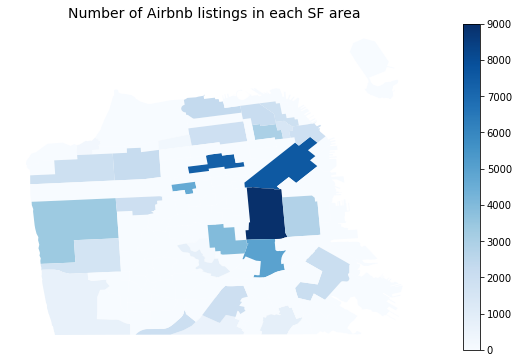

In [93]:
# Plotting the number of listings in each area
fig1, ax1 = plt.subplots(1, figsize=(15, 6))
area_map_df.plot(column='number_of_listings', cmap='Blues', ax=ax1)
ax1.axis('off')
ax1.set_title('Number of Airbnb listings in each SF area', fontsize=14)
sm = plt.cm.ScalarMappable(cmap='Blues', norm=plt.Normalize(vmin=0, vmax=9000))
sm._A = [] # Creates an empty array for the data range
cbar = fig1.colorbar(sm)
plt.show()

SoMa and the Mission district seem to have the highest number of listings 
<br>
The reason could be that those areas are close to famous spots in SF such as Market St which is a very popular tourist destination
<br>
Also considering SF as a very big tech city, many events and conventions take place near that area


C:\Users\abder\AppData\Local\Continuum\anaconda3\lib\site-packages\matplotlib\colors.py:479: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1


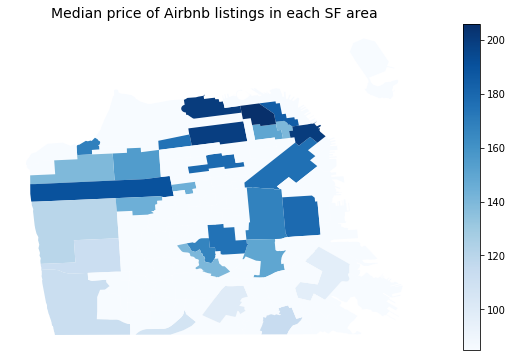

In [94]:
# Plotting the median price of listings in each area
fig2, ax2 = plt.subplots(1, figsize=(15, 6))
area_map_df.plot(column='median_price', cmap='Blues', ax=ax2)
ax2.axis('off')
ax2.set_title('Median price of Airbnb listings in each SF area', fontsize=14)
sm = plt.cm.ScalarMappable(cmap='Blues', norm=plt.Normalize(vmin=min(area_map_df.median_price), vmax=max(area_map_df.median_price)))
sm._A = [] # Creates an empty array for the data range
cbar = fig2.colorbar(sm)
plt.show()

Unsurprisingly, the prices are the highest in Marina district and Financial district, those areas are close to piers and many entertainment and food spots so it is natural that the prices are high at these areas

What are the most common types of property?

Plotting bar charts for property and room type

In [95]:
def category_count_plot(col, figsize=(8,4)):
    """
    Plots a simple bar chart of the total count for each category in the column specified.
    A figure size can optionally be specified.
    """
    plt.figure(figsize=figsize)
    listing_dropped[col].value_counts().plot(kind='bar')
    plt.title(col)
    plt.xticks(rotation=0)
    plt.show()

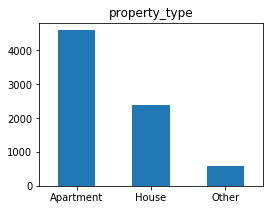

Apartment    0.605281
House        0.315644
Other        0.079076
Name: property_type, dtype: float64


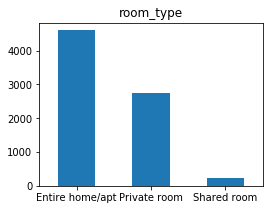

Entire home/apt    0.606601
Private room       0.363432
Shared room        0.029967
Name: room_type, dtype: float64


In [96]:
for col in ['property_type', 'room_type']:
    category_count_plot(col, figsize=(4,3)) 
    print(listing_dropped[col].value_counts(normalize=True))

Over 90% of the listed properties consists of apartments (60%) and houses (31%) 
<br>
Also most hosts are renting the entire place (60%) while other hosts are renting private places (36%)


How are the reviews distributed?

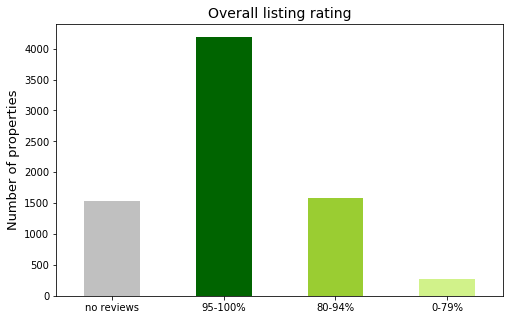

In [97]:
#Let's take look at the review section distribution
fig, ax = plt.subplots(1, 1, figsize=(8,5))  
ax.set_title('Overall listing rating', fontsize=14) 
listing_dropped['review_scores_rating'].value_counts().sort_index(ascending=False).plot(kind='bar',color=['silver', 'darkgreen', 'yellowgreen', '#d1f28a' ], ax=ax)
ax.set_xticklabels(labels=['no reviews', '95-100%', '80-94%', '0-79%'], rotation=0)
ax.set_xlabel('')
ax.set_ylabel('Number of properties', fontsize=13)
plt.show()

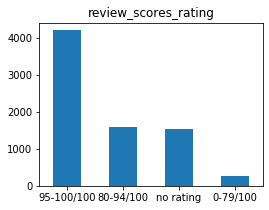

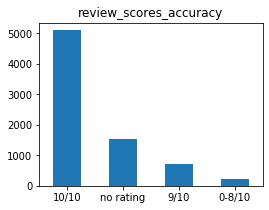

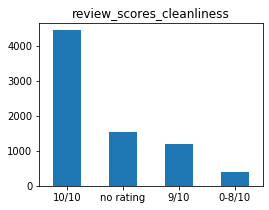

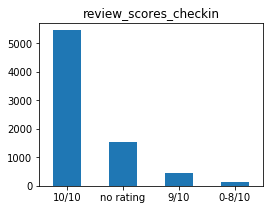

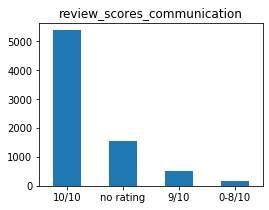

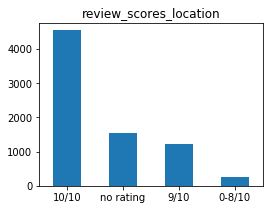

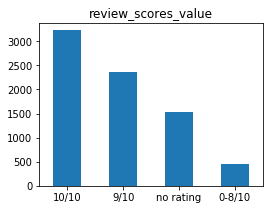

In [98]:
for col in list(listing_dropped.columns[listing_dropped.columns.str.startswith('review_scores')==True]):
    category_count_plot(col, figsize=(4,3))

We notice that most reviews are positive for every category, people seem to be enjoying their stay at those Airbnb places

Does being a superhost have an effect on the price?

In [99]:
def binary_count_and_price_plot(col, figsize=(8,3)):
    """
    Plots a simple bar chart of the counts of true and false categories in the column specified,
    next to a bar chart of the median price for each category.
    A figure size can optionally be specified.
    """
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=figsize)
    fig.suptitle(col, fontsize=16, y=1)
    plt.subplots_adjust(top=0.80)

    listing_dropped.groupby(col).size().plot(kind='bar', ax=ax1, color=['firebrick', 'seagreen'])
    ax1.set_xticklabels(labels=['false', 'true'], rotation=0)
    ax1.set_title('category_count') 
    ax1.set_xlabel('')
    
    listing_dropped.groupby(col).price.median().plot(kind='bar', ax=ax2, color=['firebrick', 'seagreen'])
    ax2.set_xticklabels(labels=['false', 'true'], rotation=0)
    ax2.set_title('median ($)')
    ax2.set_xlabel('')
    
    plt.show

0    0.590231
1    0.409769
Name: host_is_superhost, dtype: float64


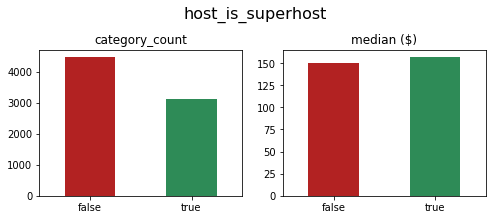

In [100]:
binary_count_and_price_plot('host_is_superhost')   
print(listing_dropped.host_is_superhost.value_counts(normalize=True))

About 60% of hosts are superhosts, however this doesn’t seem to affect the price for the listing

1    0.57769
0    0.42231
Name: host_identity_verified, dtype: float64


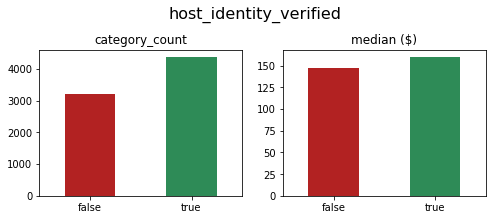

In [101]:
#Let's check now the relation between the host identity and the price
binary_count_and_price_plot('host_identity_verified')   
print(listing_dropped.host_identity_verified.value_counts(normalize=True))

Let's check now the relation between instant bookable and the price


0    0.607261
1    0.392739
Name: instant_bookable, dtype: float64


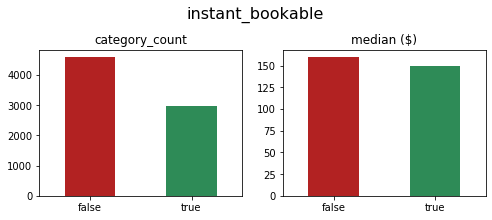

In [102]:
binary_count_and_price_plot('instant_bookable')   
print(listing_dropped.instant_bookable.value_counts(normalize=True))

About 40% of the properties can be booked instantly, but the price is not affected by this 

Do the amenities affect the price?

C:\Users\abder\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  import sys


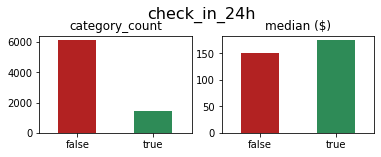

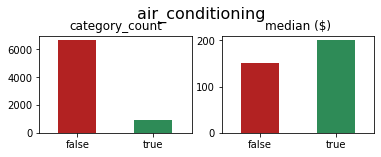

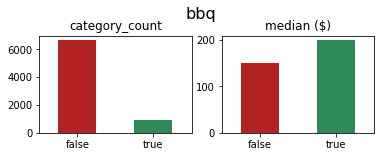

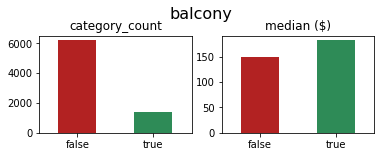

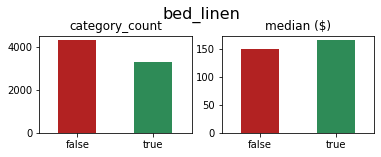

...

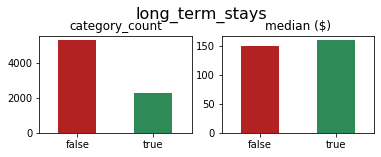

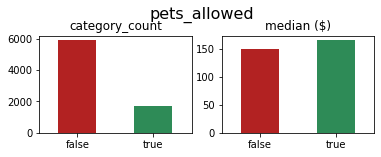

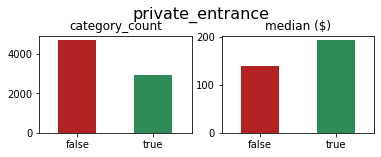

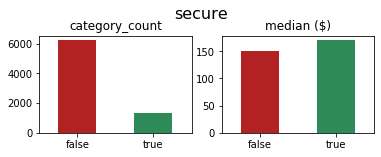

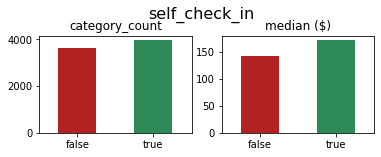

In [103]:
for col in listing_dropped.iloc[:,36:-2].columns:
    binary_count_and_price_plot(col, figsize=(6,2))

Price does not seem to be affected by the following amenities:
<br>
24h check-in, Bed linen, Breakfast, Coffee machine, Cooking basics, white goods, elevator


Let's now drop the columns that we used for EDA that we do not need for our model

In [104]:
listing_dropped.drop(['host_neighbourhood'], axis=1, inplace=True)    
listing_dropped.drop(['amenities'], axis=1, inplace=True)    

In [105]:
listing_dropped.head()

,id,host_response_time,host_response_rate,host_is_superhost,host_listings_count,host_identity_verified,areas,property_type,room_type,accommodates,bathrooms,bedrooms,beds,price,security_deposit,cleaning_fee,guests_included,extra_people,minimum_nights,maximum_nights,availability_90,number_of_reviews,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,instant_bookable,cancellation_policy,require_guest_profile_picture,require_guest_phone_verification,days_active,check_in_24h,air_conditioning,bbq,balcony,bed_linen,breakfast,tv,coffee_machine,cooking_basics,white_goods,elevator,gym,child_friendly,parking,outdoor_space,host_greeting,internet,long_term_stays,pets_allowed,private_entrance,secure,self_check_in,days_since_first_review,days_since_last_review
0,958,within a few hours,100%,1,1,1,Western Addition,Apartment,Entire home/apt,3,1.0,1.0,2.0,170,100,100,2,25,1,30,7,192,95-100/100,10/10,10/10,10/10,10/10,10/10,9/10,1,moderate,0,0,3958.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,1.0,0.0,1.0,4+ years,2-8 weeks
1,5858,within a day,100%,0,2,1,Bernal Heights,Apartment,Entire home/apt,5,1.0,2.0,3.0,235,0,100,2,0,30,60,0,111,95-100/100,10/10,10/10,10/10,10/10,10/10,9/10,0,strict_14_with_grace_period,0,0,3744.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,4+ years,1+ years
2,7918,within a few hours,100%,0,10,1,Haight Ashbury,Apartment,Private room,2,4.0,1.0,1.0,65,200,50,1,12,32,60,90,17,80-94/100,0-8/10,0-8/10,9/10,9/10,9/10,0-8/10,0,strict_14_with_grace_period,0,0,3637.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,4+ years,1+ years
3,8142,within a few hours,100%,0,10,1,Haight Ashbury,Apartment,Private room,2,4.0,1.0,1.0,65,200,50,1,12,32,90,71,8,80-94/100,9/10,9/10,10/10,10/10,9/10,9/10,0,strict_14_with_grace_period,0,0,3637.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,1.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,4+ years,6-12 months
4,8339,within an hour,100%,0,2,1,Western Addition,House,Entire home/apt,5,1.5,2.0,2.0,685,0,225,2,150,4,1125,90,27,95-100/100,10/10,10/10,10/10,10/10,10/10,9/10,0,moderate,1,1,3622.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,4+ years,6-12 months


Let's transform our dataset by using get dummies function

In [106]:
listing_transformed = pd.get_dummies(listing_dropped)

In [107]:
listing_transformed.shape

(7575, 138)

Let's drop some of the columns generated by get_dummies to avoid the dummy trap

In [108]:
listing_transformed.drop(['days_since_last_review_no reviews', 'days_since_first_review_no reviews', 
                          'cancellation_policy_strict_14_with_grace_period', 'review_scores_value_no rating',
                         'review_scores_location_no rating', 'review_scores_communication_no rating', 
                         'review_scores_checkin_no rating', 'review_scores_cleanliness_no rating', 
                         'review_scores_accuracy_no rating', 'review_scores_rating_no rating',
                         'room_type_Shared room', 'property_type_Other', 'areas_West of Twin Peaks',
                         'host_response_rate_unknown', 'host_response_time_unknown'], axis=1, inplace=True)

In [109]:
df_corr = listing_transformed.corr().round(2)
df_corr.loc['price'].sort_values(ascending = False)

price                                 1.00
accommodates                          0.55
bedrooms                              0.52
beds                                  0.46
guests_included                       0.36
cleaning_fee                          0.33
room_type_Entire home/apt             0.32
bathrooms                             0.25
security_deposit                      0.24
tv                                    0.21
child_friendly                        0.19
white_goods                           0.14
private_entrance                      0.14
extra_people                          0.13
balcony                               0.12
air_conditioning                      0.11
bbq                                   0.11
secure                                0.10
review_scores_rating_95-100/100       0.10
gym                                   0.10
coffee_machine                        0.09
parking                               0.09
review_scores_cleanliness_10/10       0.09
areas_Russi

In [110]:
sns.set(font_scale=.8)

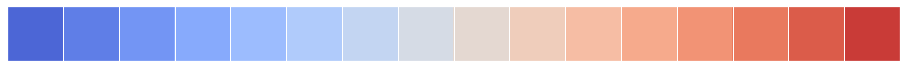

In [111]:
# Using palplot to view a color scheme
sns.palplot(sns.color_palette('coolwarm', 16))

fig, ax = plt.subplots(figsize=(165,165))

df_corr2 = df_corr

sns.heatmap(df_corr2,
            cmap = 'coolwarm',
            square = True,
            annot = True,
            annot_kws={"size": 20},
            linecolor = 'black',
            linewidths = 0.5)

plt.savefig('Listings Correlation Heatmap.png')
plt.show()

Looking at the districts, they don't seem to have a strong correlation with the other features
<br>
Let's drop them and try to visualize the other features for a clearer information

In [112]:
df_corr_no_area = listing_transformed.drop(list(listing_transformed.columns[listing_transformed.columns.str.startswith('areas')]), axis=1).corr().round(2)
print(df_corr_no_area)
df_corr_no_area.loc['price'].sort_values(ascending = False)

                                       id  host_is_superhost  \
id                                   1.00              -0.15   
host_is_superhost                   -0.15               1.00   
host_listings_count                  0.21               0.12   
host_identity_verified              -0.33               0.16   
accommodates                        -0.03              -0.01   
bathrooms                            0.03              -0.08   
bedrooms                            -0.06              -0.01   
beds                                -0.04              -0.04   
price                               -0.00               0.01   
security_deposit                    -0.11              -0.00   
cleaning_fee                         0.00               0.04   
guests_included                     -0.10               0.04   
extra_people                        -0.14               0.06   
minimum_nights                      -0.00              -0.01   
maximum_nights                      -0.0

price                                 1.00
accommodates                          0.55
bedrooms                              0.52
beds                                  0.46
guests_included                       0.36
cleaning_fee                          0.33
room_type_Entire home/apt             0.32
bathrooms                             0.25
security_deposit                      0.24
tv                                    0.21
child_friendly                        0.19
private_entrance                      0.14
white_goods                           0.14
extra_people                          0.13
balcony                               0.12
bbq                                   0.11
air_conditioning                      0.11
secure                                0.10
gym                                   0.10
review_scores_rating_95-100/100       0.10
coffee_machine                        0.09
parking                               0.09
review_scores_cleanliness_10/10       0.09
outdoor_spa

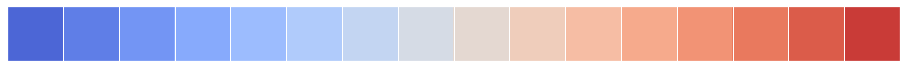

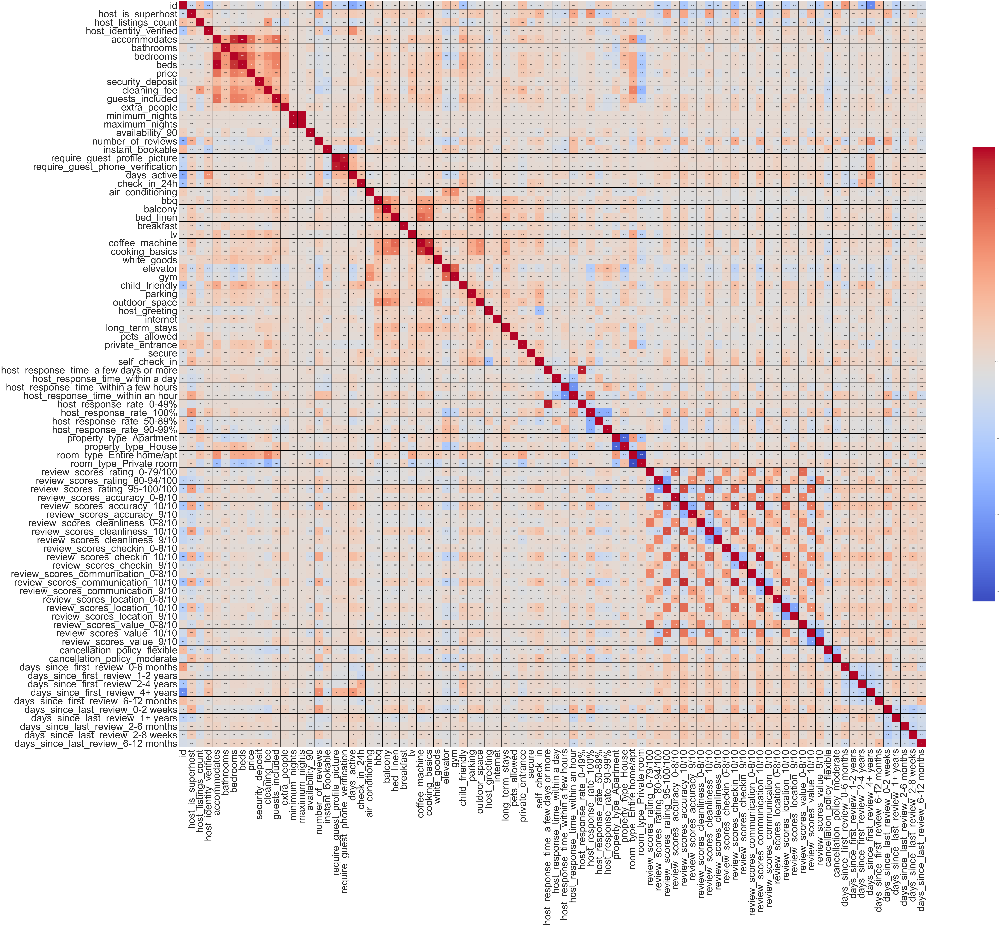

In [113]:
# Using palplot to view a color scheme
sns.palplot(sns.color_palette('coolwarm', 16))

fig, ax = plt.subplots(figsize=(120,120))

df_corr_no_area2 = df_corr_no_area

sns.heatmap(df_corr_no_area2,
            cmap = 'coolwarm',
            square = True,
            annot = True,
            cbar_kws={"shrink": .5},
            vmax=df_corr_no_area2[df_corr_no_area2 != 1.0].max().max(),
            linecolor = 'black',
            linewidths = 0.5)
plt.xticks(fontsize=70, rotation=90)
plt.yticks(fontsize=70, rotation=0)
plt.savefig('Listings Correlation without the areas Heatmap.png')
plt.show()

From the heatmap above we see that the following features are highly correlated with eachother:
<br>
'Bedrooms' and 'Beds' is highly correlated with 'Accommodates'
<br>
'host_response_rate_0 - 49%'is highly correlated with 'host_response_time_few days or more'
<br>
'Property_type_house' and 'property_type_apartment'
<br>
'room_type_entire home/apt' and 'room_type_private room'
<br>
guest requiring a profile pic and guest requiring a phone verif
<br>
most of the reviews types are relatively correlated with eachother since if a host is gettig a good review in a certain category, he is more likely to get a good review in the rest of the categories but for we will keep them for our model, we can always experiment later by removing these features and see the impact on the model



Next, Let's drop some of the features that are causing the multi-collinearity

In [114]:
listing_transformed.drop(['beds', 'bedrooms', 'host_response_rate_0-49%', 'property_type_Apartment', 
                          'room_type_Private room', 'require_guest_profile_picture', 'id'], axis=1, inplace=True)

In [115]:
df_corr_no_area1 = listing_transformed.drop(list(listing_transformed.columns[listing_transformed.columns.str.startswith('areas')]), axis=1).corr().round(2)
print(df_corr_no_area1)
df_corr_no_area1.loc['price'].sort_values(ascending = False)

                                     host_is_superhost  host_listings_count  \
host_is_superhost                                 1.00                 0.12   
host_listings_count                               0.12                 1.00   
host_identity_verified                            0.16                 0.04   
accommodates                                     -0.01                -0.02   
bathrooms                                        -0.08                -0.00   
price                                             0.01                -0.02   
security_deposit                                 -0.00                -0.00   
cleaning_fee                                      0.04                 0.40   
guests_included                                   0.04                -0.12   
extra_people                                      0.06                -0.15   
minimum_nights                                   -0.01                -0.00   
maximum_nights                                   -0.

price                                    1.00
accommodates                             0.55
guests_included                          0.36
cleaning_fee                             0.33
room_type_Entire home/apt                0.32
bathrooms                                0.25
security_deposit                         0.24
tv                                       0.21
child_friendly                           0.19
white_goods                              0.14
private_entrance                         0.14
extra_people                             0.13
balcony                                  0.12
air_conditioning                         0.11
bbq                                      0.11
review_scores_rating_95-100/100          0.10
gym                                      0.10
secure                                   0.10
parking                                  0.09
coffee_machine                           0.09
review_scores_cleanliness_10/10          0.09
outdoor_space                     

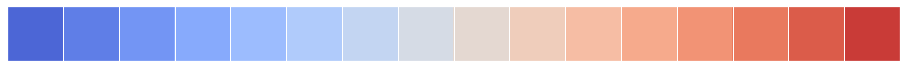

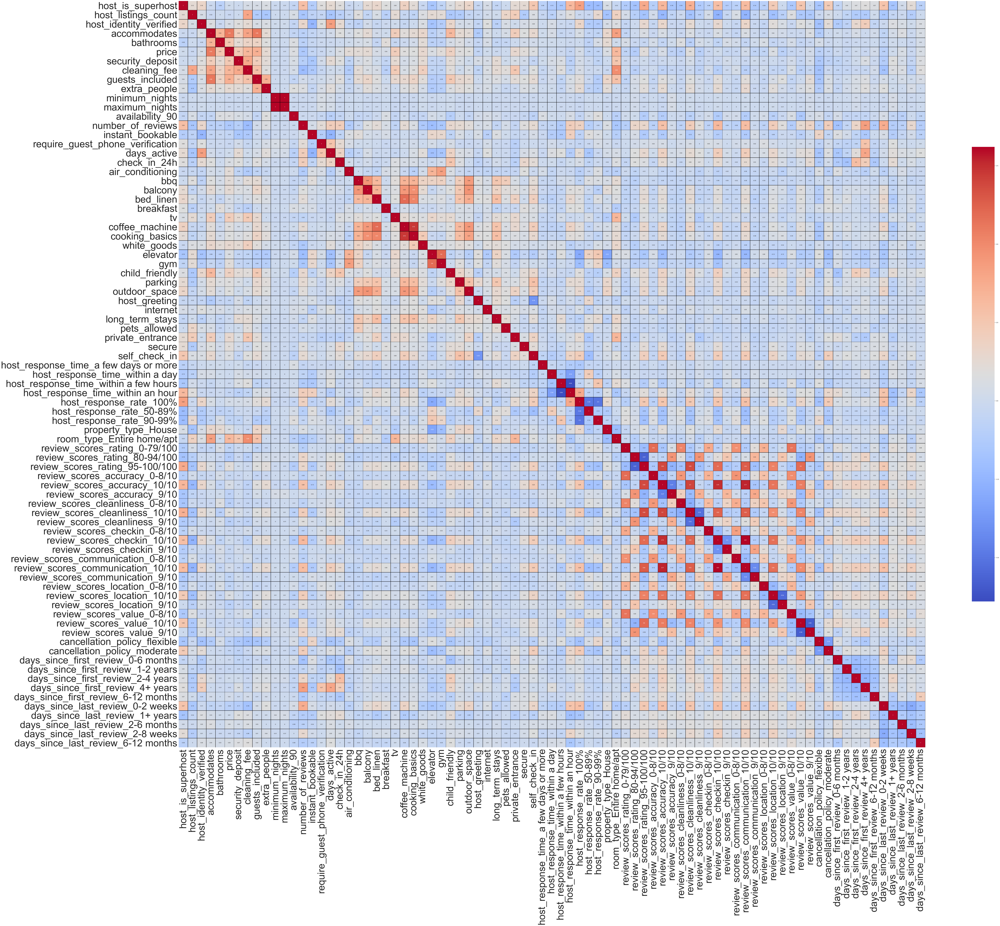

In [116]:
# Using palplot to view a color scheme
sns.palplot(sns.color_palette('coolwarm', 16))

fig, ax = plt.subplots(figsize=(120,120))

df_corr_no_area3 = df_corr_no_area1

sns.heatmap(df_corr_no_area3,
            cmap = 'coolwarm',
            square = True,
            annot = True,
            cbar_kws={"shrink": .5},
            vmax=df_corr_no_area3[df_corr_no_area3 != 1.0].max().max(),
            linecolor = 'black',
            linewidths = 0.5)
plt.xticks(fontsize=70, rotation=90)
plt.yticks(fontsize=70, rotation=0)
plt.savefig('Listings Correlation without the areas Heatmap.png')
plt.show()

### Splitting the data

In [117]:
X= listing_transformed.drop(['price'], axis=1)
y= listing_transformed['price']

In [118]:
#Scaling the features
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
X = pd.DataFrame(scaler.fit_transform(X), columns=list(X.columns))

In [119]:
# Splitting into train and test sets
X_train, X_test, Y_train, Y_test = train_test_split(X, y, test_size=0.2, random_state=13)

### Trying multiple models

In [120]:
from sklearn import linear_model
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor
from sklearn.linear_model import SGDRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.svm import SVR, LinearSVR
from sklearn.naive_bayes import GaussianNB

In [121]:
#Linear Regression
linreg = LinearRegression()
linreg.fit(X_train, Y_train )

Y_pred= linreg.predict(X_test)

linreg.score(X_train, Y_train)
acc_linreg = round(linreg.score(X_train, Y_train) * 100, 2)


#Random forest
random_forest = RandomForestRegressor(n_estimators=100)
random_forest.fit(X_train, Y_train)

Y_prediction = random_forest.predict(X_test)

random_forest.score(X_train, Y_train)
acc_random_forest = round(random_forest.score(X_train, Y_train) * 100, 2)


#KNN
knn = KNeighborsRegressor(n_neighbors = 3) 
knn.fit(X_train, Y_train)  

Y_pred = knn.predict(X_test)  

acc_knn = round(knn.score(X_train, Y_train) * 100, 2)

#Gaussian Naive Bayes
gaussian = GaussianNB() 
gaussian.fit(X_train, Y_train)  

Y_pred = gaussian.predict(X_test)  

acc_gaussian = round(gaussian.score(X_train, Y_train) * 100, 2)

#Linear Support Vector
linear_svc = LinearSVR()
linear_svc.fit(X_train, Y_train)

Y_pred = linear_svc.predict(X_test)

acc_linear_svc = round(linear_svc.score(X_train, Y_train) * 100, 2)


#putting the results:
results = pd.DataFrame({
    'Model': ['Support Vector Machines', 'KNN', 'Linear Regression', 
              'Random Forest', 'Naive Bayes',  
              ],
    'Score': [acc_linear_svc, acc_knn, acc_linreg, 
              acc_random_forest, acc_gaussian,  
              ]})
result_df = results.sort_values(by='Score', ascending=False)
result_df = result_df.set_index('Score')
result_df.head(6)

,Model
Score,
94.25,Random Forest
66.32,KNN
43.85,Linear Regression
34.49,Support Vector Machines
16.85,Naive Bayes


From the score above, it seems that Random forest is performing better